In [202]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.image import pad_to_bounding_box
from tensorflow.image import central_crop
from tensorflow.image import resize

In [203]:
bgd = image.load_img('dogs.png')

In [204]:
image.img_to_array(bgd).shape # 높이, 너비, 채널

(1157, 1148, 3)

In [205]:
bgd_vector = np.asarray(image.img_to_array(bgd))

In [206]:
bgd_vector = bgd_vector / 255 #정규화 과정

In [207]:
'''
정규화 표준화

데이터에 대한 단위가 다른 경우 일정 범위로 데이터가 오게

정규화 - 데이터의 범위가 차이가 많이 있을 때 공통의 척도 0~1 사이

표준화 - 평균으로부터 얼마나 떨어져 있는지 표준편차의 단위로 표현, 평균이 0이 되도록 표준편차가 1이 되도록 만듬

정규분포를 따르는 데이터(몸무게-키) 표준화가 일반적 (보통 많이씀)

정규성이 없는 데이터 정규화
'''

'\n정규화 표준화\n\n데이터에 대한 단위가 다른 경우 일정 범위로 데이터가 오게\n\n정규화 - 데이터의 범위가 차이가 많이 있을 때 공통의 척도 0~1 사이\n\n표준화 - 평균으로부터 얼마나 떨어져 있는지 표준편차의 단위로 표현, 평균이 0이 되도록 표준편차가 1이 되도록 만듬\n\n정규분포를 따르는 데이터(몸무게-키) 표준화가 일반적 (보통 많이씀)\n\n정규성이 없는 데이터 정규화\n'

In [208]:
bgd_vector.shape

(1157, 1148, 3)

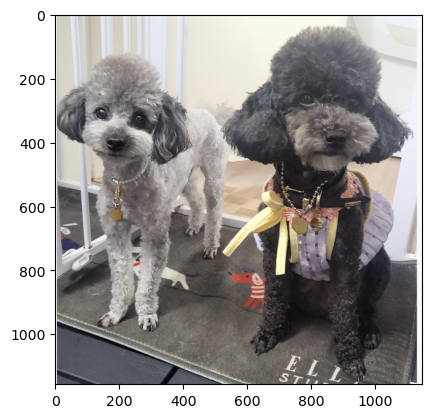

In [209]:
plt.imshow(bgd_vector)
plt.show()

In [210]:
#이미지의 변경할 크기 설정 
target_height = 4500
target_width = 4500

#현재 이미지의 크기 지정 
source_height = bgd_vector.shape[0]
source_width = bgd_vector.shape[1]

#padding 실시 : pad_to_bounding_box 사용 
bgd_vector_pad = pad_to_bounding_box(bgd_vector, 
                                     int((target_height-source_height)/2), 
                                     int((target_width-source_width)/2), 
                                     target_height, 
                                     target_width)

In [211]:
 #이미지 형태 확인 
bgd_vector_pad.shape

TensorShape([4500, 4500, 3])

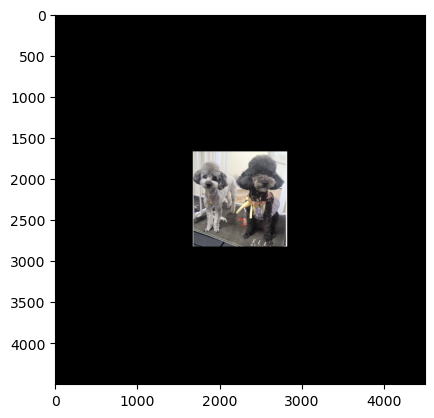

In [212]:
#이미지 확인 
plt.imshow(bgd_vector_pad)
plt.show()

#이미지 저장 
image.save_img('dogs_pad.png', bgd_vector_pad)

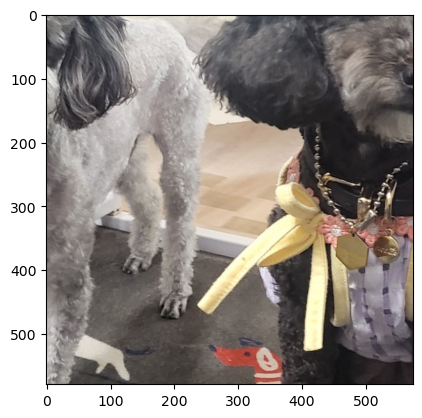

In [213]:
#가운데를 중심으로 50%만 crop 
bgd_vector_crop = central_crop(bgd_vector, .5)
 
bgd_vector_crop.shape
 
plt.imshow(bgd_vector_crop)
plt.show()

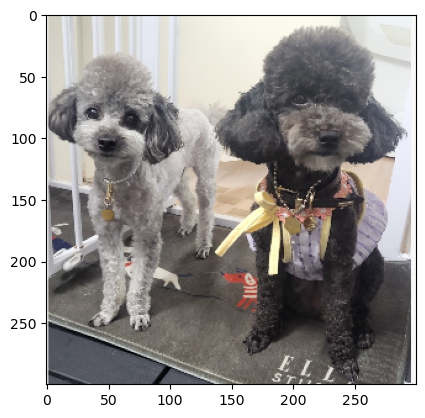

In [214]:
bgd_vector_resize = resize(bgd_vector, (300,300))
 
bgd_vector_resize.shape
 
plt.imshow(bgd_vector_resize)

In [215]:
#사전학습 모델 불러오기 : 케라스에서 클래스 형태로 제공함 
from tensorflow.keras.applications.vgg16 import VGG16

from tensorflow.keras.applications.vgg19 import VGG19

model = VGG19(weights='imagenet', include_top=True)
model.summary()
#weight, include_top 파라미터 설정 
#model = VGG16(weights='imagenet', include_top=True)
#model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [216]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
 
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
 
img = Image.open('dogs.png')

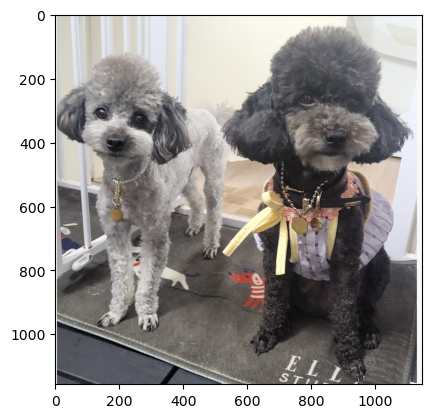

In [217]:
#img
plt.imshow(np.asarray(img))

In [218]:
img.size

(1148, 1157)

In [219]:
w, h = img.size
s = min(w, h) #1148

In [220]:
s

1148

In [221]:
y = (h - s) // 2
x = (w - s) // 2

In [222]:
x

0

In [223]:
y

4

In [224]:
print(w, h, x, y, s)

1148 1157 0 4 1148


In [225]:
img = img.crop((x, y, x+s, y+s)) #이미지 크기 변경 함수 좌측상단x,y 부터 우측하단x+s,y+s 까지

In [226]:
img.size

(1148, 1148)

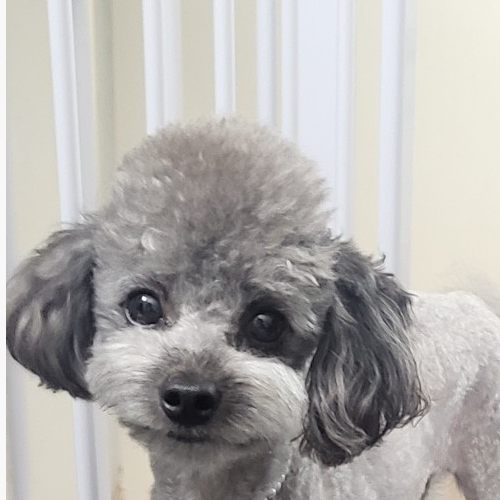

In [227]:
img.crop((0, 0, 500, 500))

In [228]:
model.layers[0].input_shape

[(None, 224, 224, 3)]

In [229]:
target_size = 224
img = img.resize((target_size, target_size)) # 이미지 사이즈 조정

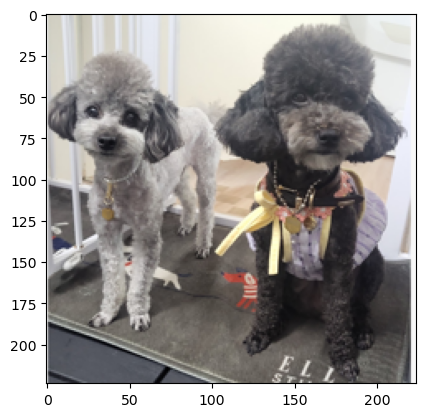

In [230]:
plt.imshow(np.asarray(img))

In [231]:
np_img = image.img_to_array(img)
np_img.shape  #(224, 224, 3) 채널 컬러 3, 흑백 1

(224, 224, 3)

In [232]:
img_batch = np.expand_dims(np_img, axis=0) #차원추가 함수
img_batch.shape

(1, 224, 224, 3)

In [233]:
pre_processed = preprocess_input(img_batch) # from tensorflow.keras.applications.vgg16 import preprocess_input

In [234]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 0s 239ms/step


0.64890903

In [235]:
np.sum(y_preds)

1.0

In [236]:
decode_predictions(y_preds, top=10)

[[('n02113624', 'toy_poodle', 0.64890903),
  ('n02113712', 'miniature_poodle', 0.31390503),
  ('n02113799', 'standard_poodle', 0.02586555),
  ('n02093647', 'Bedlington_terrier', 0.005780726),
  ('n02096437', 'Dandie_Dinmont', 0.0021330859),
  ('n02086240', 'Shih-Tzu', 0.0007840384),
  ('n02102318', 'cocker_spaniel', 0.0007056672),
  ('n02085936', 'Maltese_dog', 0.00038637887),
  ('n02105641', 'Old_English_sheepdog', 0.00018144789),
  ('n02098413', 'Lhasa', 0.00017559987)]]

In [237]:
###이미지 증식###

In [238]:
image = Image.open('dogs.png').resize((500, 400))

In [239]:
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

In [240]:
image_tensor.shape

(400, 500, 3)

In [241]:
'''
train = 20명 * 10장 이미지(대한민국)

test = 20명 * 3장 이미지(대한민국)

번호 부여 : 0 ~ 20번 -> 원핫인코딩

이미지 증식(가능하면)

- 성능비교

- 다양한 증식

- 증식된 파일 저장 ex) train = 20명 * 10장 = 200장 -> 1장당 회전/반전/... 5장으로 증식 -> 5 * 200 = 1000장

1000장 -> cnn -> 모델 -> test 진행 -> 정확도

16

문성민

train_160.jpg ~ train_169.jpg

test_048.jpg ~ test_050.jpg

(500, 150, 3)

(200, 500, 150, 3)

xtrain = (200,500,150,3)

ytrain = (200,20)

xtest=(60,500,150,3)

ytest=(60,20)

xtrain, ytrain data 구성 -> CNN 모델 -> xtest -> ypred 와 ytest를 비교하여 성능 출력
'''

'\ntrain = 20명 * 10장 이미지(대한민국)\n\ntest = 20명 * 3장 이미지(대한민국)\n\n번호 부여 : 0 ~ 20번 -> 원핫인코딩\n\n이미지 증식(가능하면)\n\n- 성능비교\n\n- 다양한 증식\n\n- 증식된 파일 저장 ex) train = 20명 * 10장 = 200장 -> 1장당 회전/반전/... 5장으로 증식 -> 5 * 200 = 1000장\n\n1000장 -> cnn -> 모델 -> test 진행 -> 정확도\n\n16\n\n문성민\n\ntrain_160.jpg ~ train_169.jpg\n\ntest_048.jpg ~ test_050.jpg\n\n(500, 150, 3)\n\n(200, 500, 150, 3)\n\nxtrain = (200,500,150,3)\n\nytrain = (200,20)\n\nxtest=(60,500,150,3)\n\nytest=(60,20)\n\nxtrain, ytrain data 구성 -> CNN 모델 -> xtest -> ypred 와 ytest를 비교하여 성능 출력\n'

In [242]:
# Flip(left_right / up_down) 반전

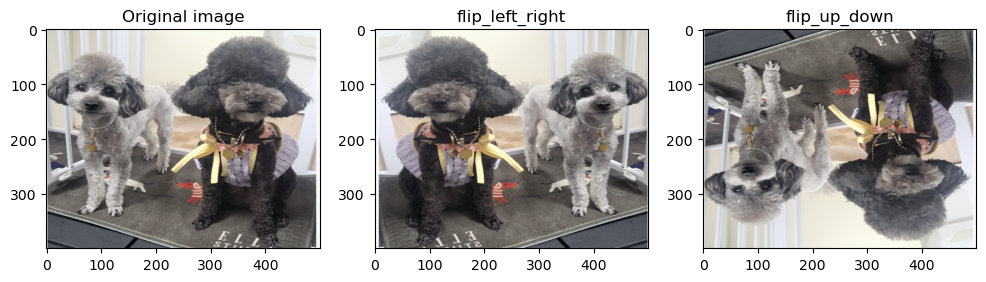

In [243]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)


plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

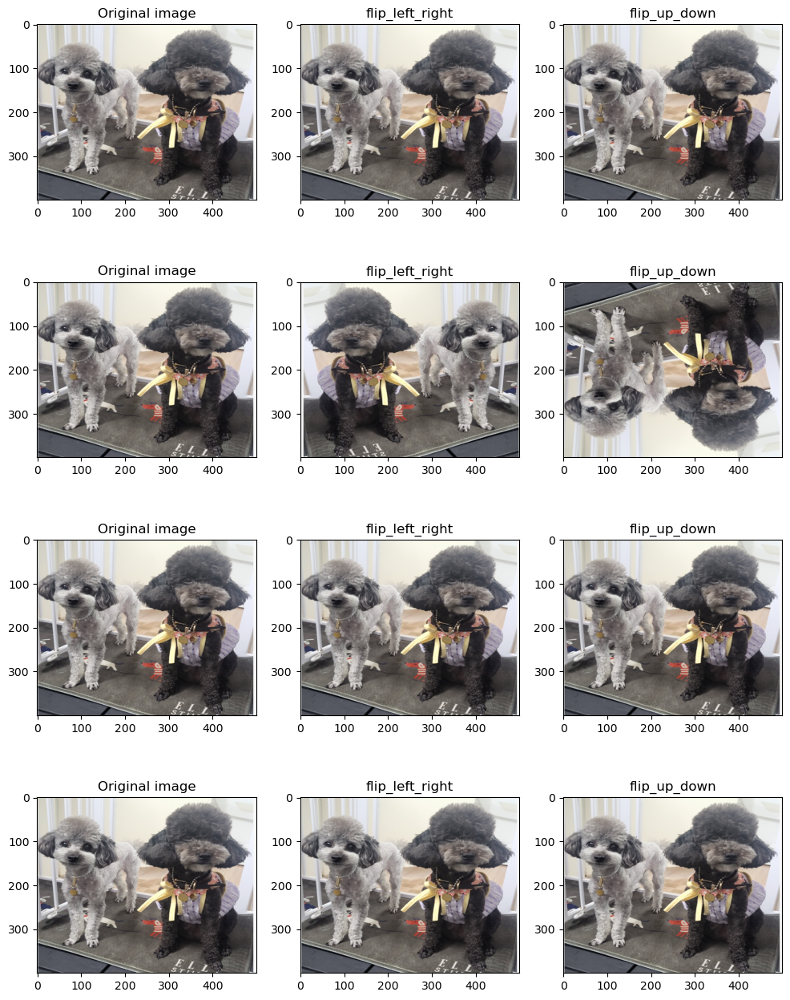

In [244]:
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
  flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
  flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
  flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
  flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

  plt.subplot(4,3, i*3+1)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(4,3,i*3+2)
  plt.title('flip_left_right')
  plt.imshow(flip_lr_image)

  plt.subplot(4,3,i*3+3)
  plt.title('flip_up_down')
  plt.imshow(flip_ud_image)

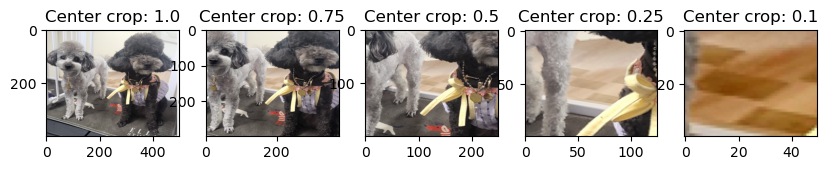

In [245]:
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)

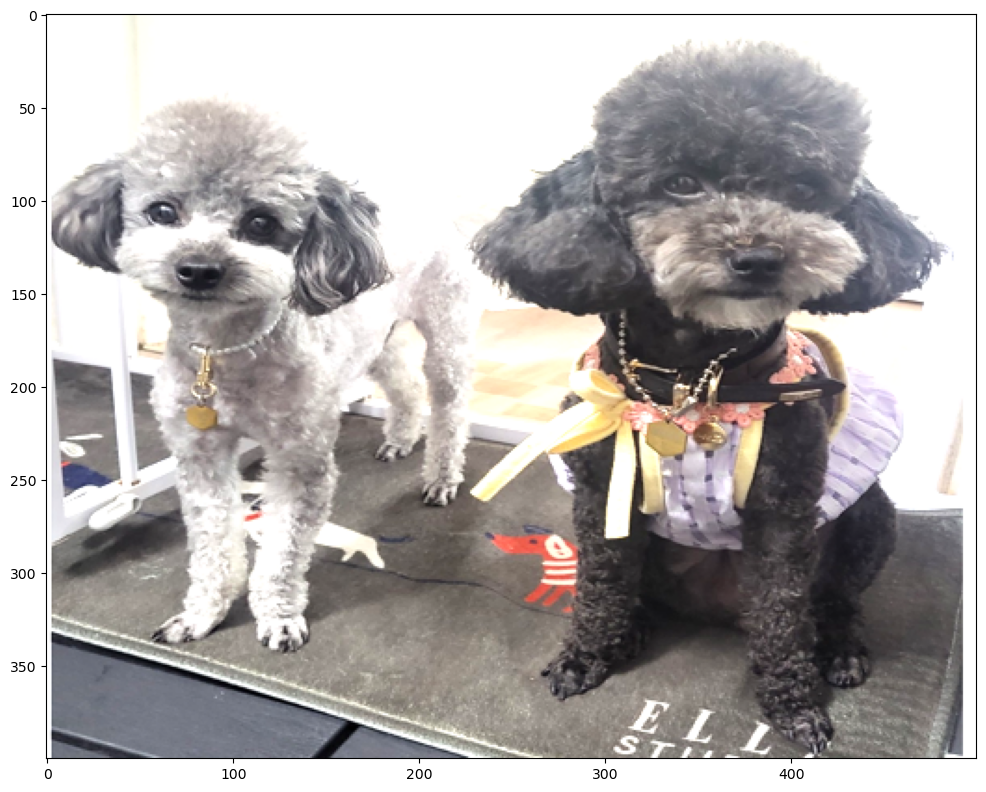

In [246]:
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

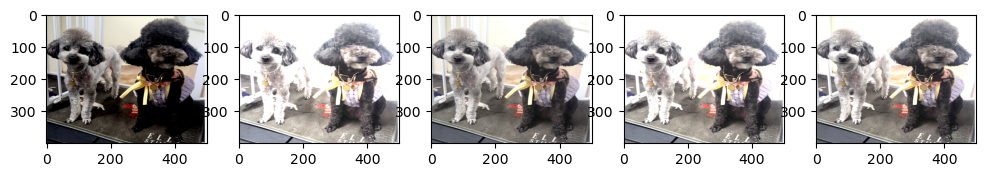

In [247]:
plt.figure(figsize=(12,15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128) # max_delta 최대 밝기
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1, 5, i+1)
  plt.imshow(random_bright_image)

In [248]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


In [249]:
import numpy as np
image = Image.open('dogs.png').resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

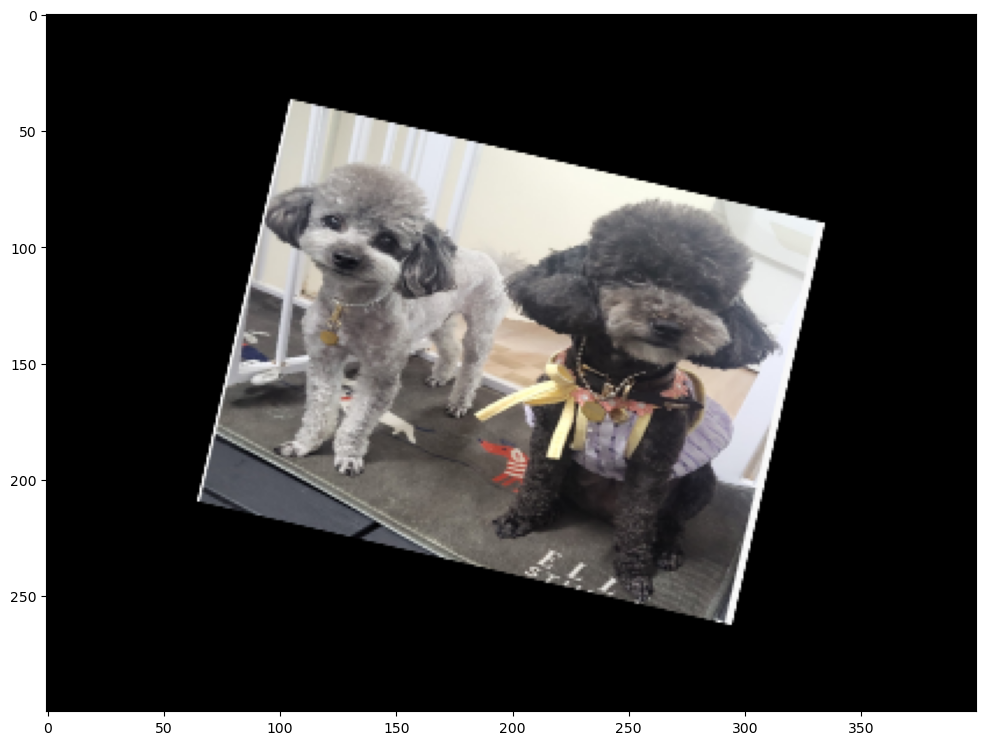

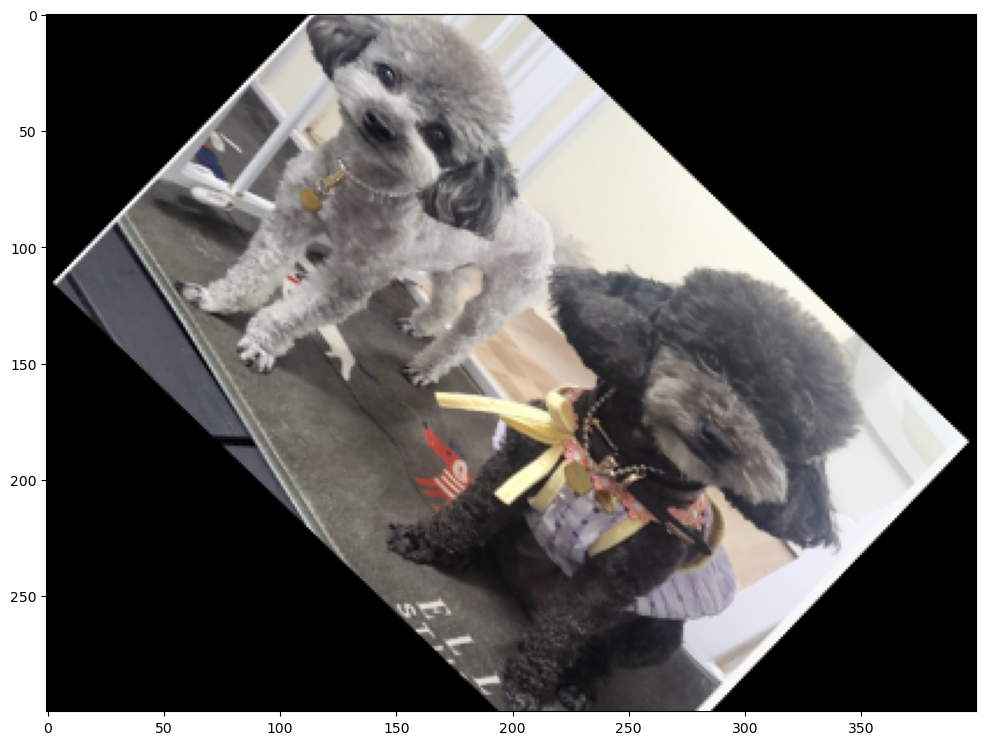

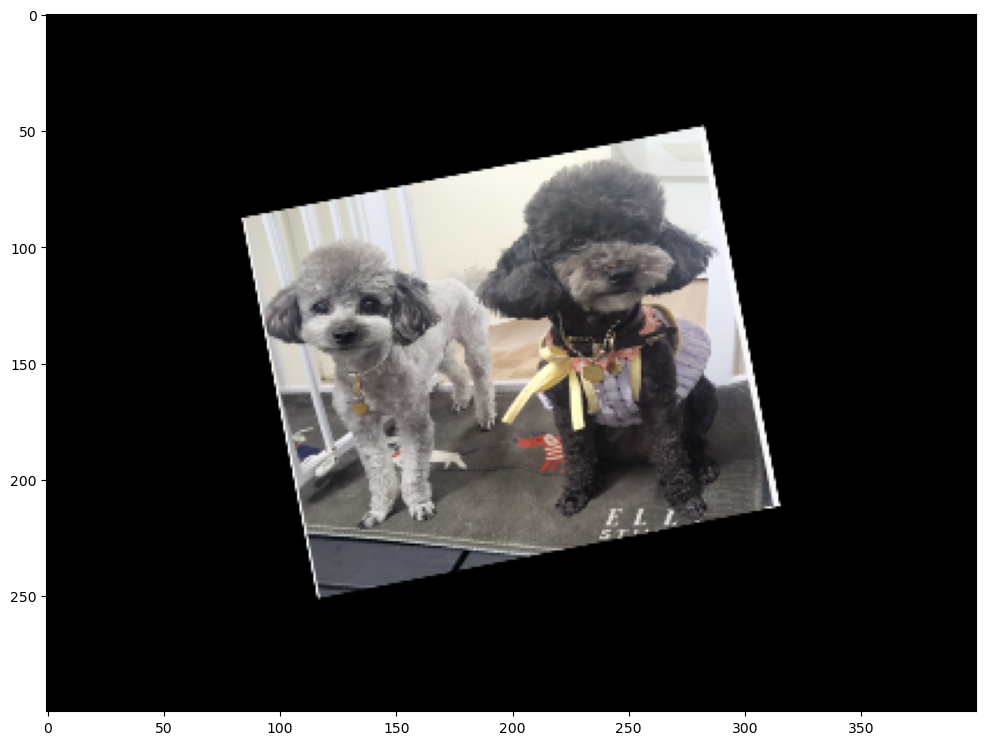

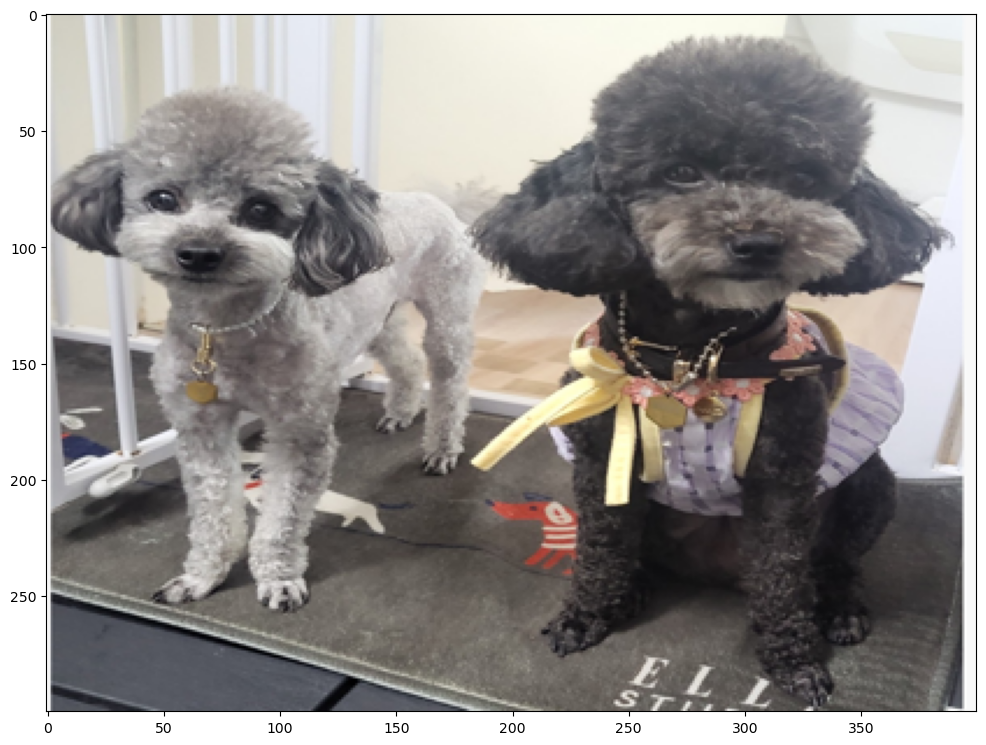

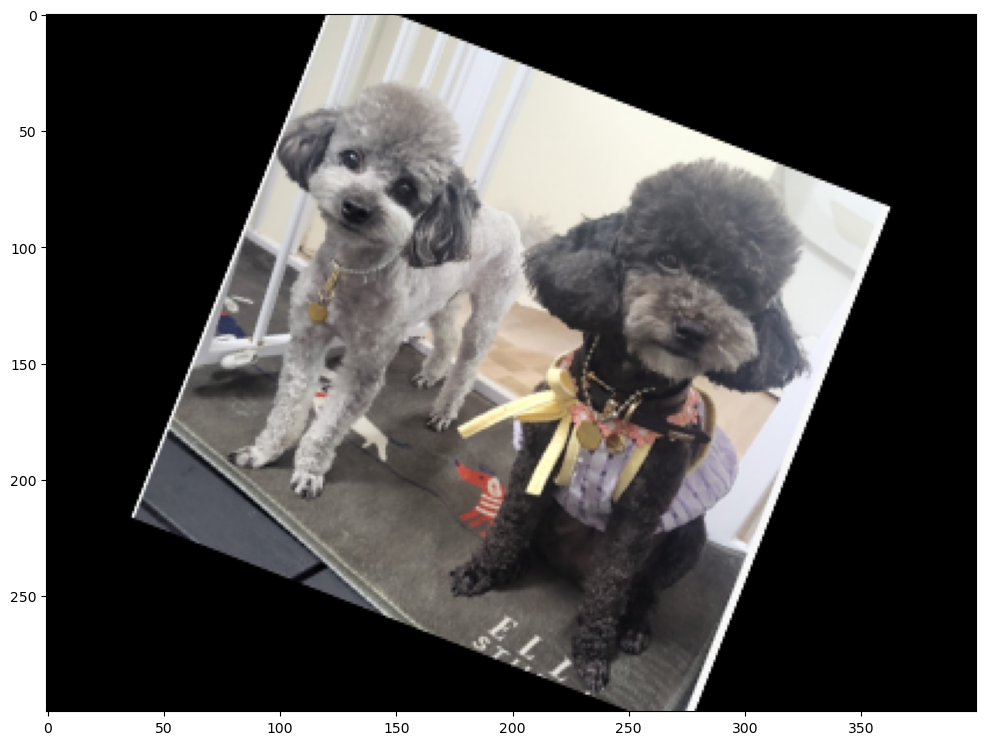

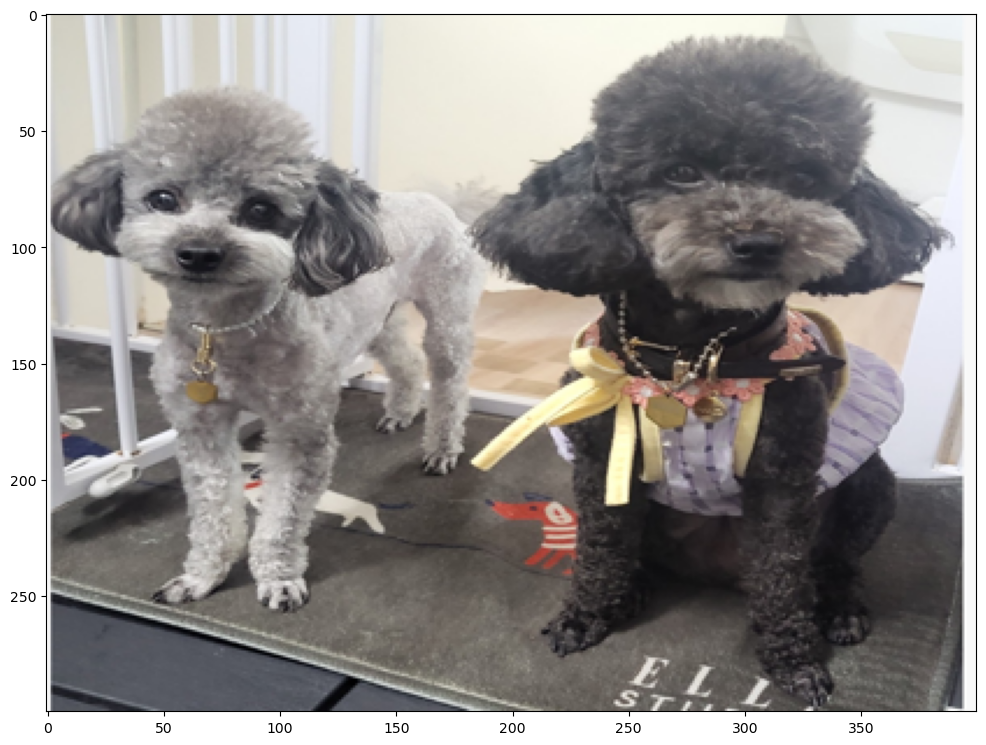

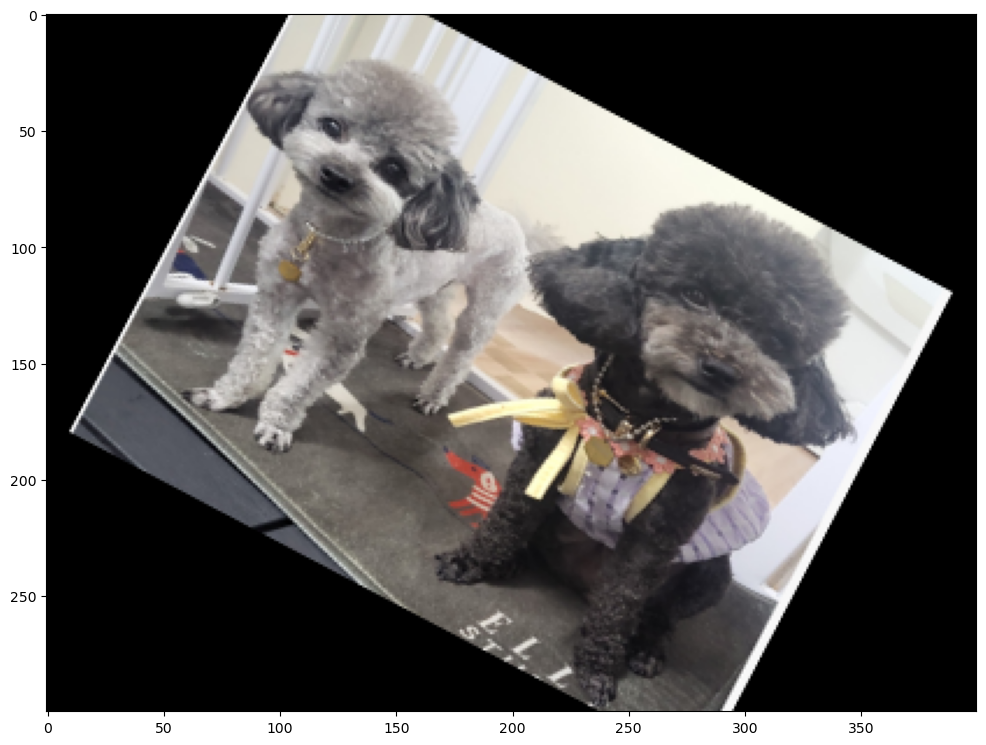

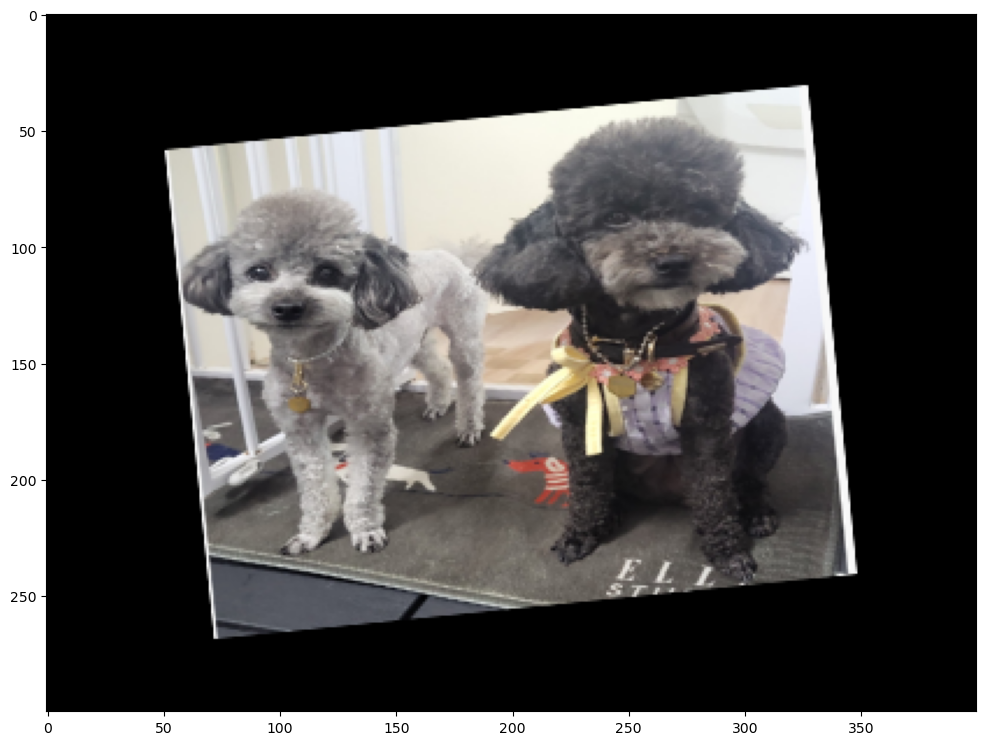

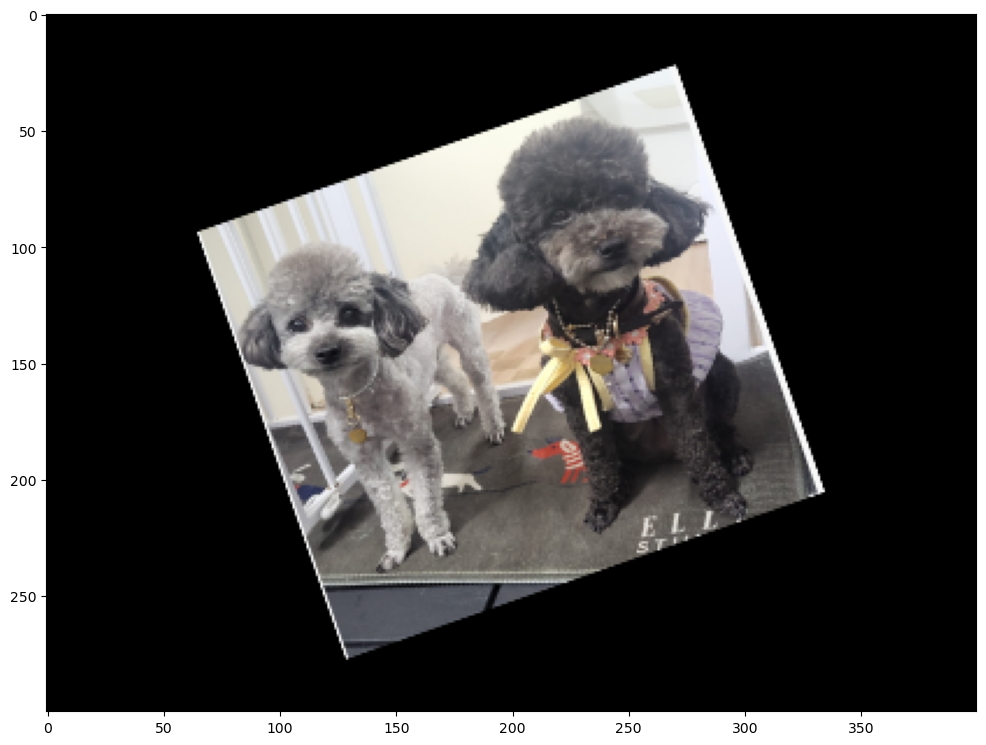

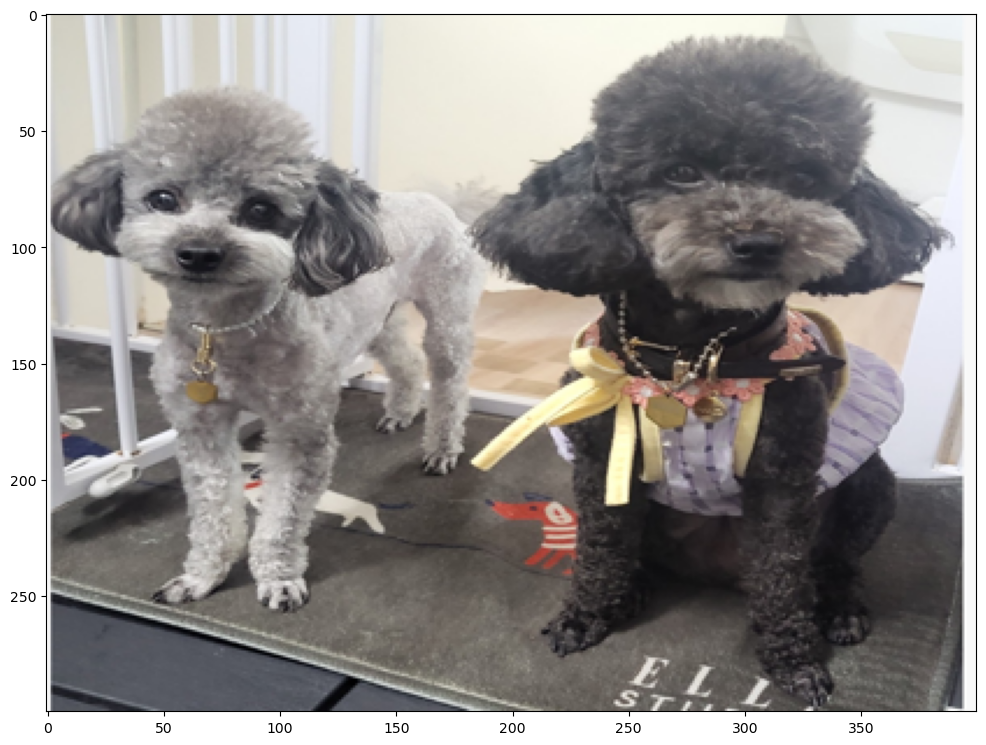

In [250]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
      A.Affine(rotate=(-45,45), scale=(0.5,0.9), p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

In [251]:
######################################################################################################################################

In [254]:
from tensorflow.keras.preprocessing.image import img_to_array

In [255]:
x_train=[]
for i in range(160,170):
    Img=Image.open(f'images/train_{i}.jpg').resize((500, 150))
    Img.save(f'images/train_{i}.jpg')
    x_train.append(img_to_array(Img))

AttributeError: open

In [ ]:
type(x_train)

In [ ]:
x_train